In [1]:
from collections import defaultdict

import jax

# jax.config.update("jax_platform_name", "cpu")
import jax.numpy as jnp
import jax.random as jr
import matplotlib.pyplot as plt
import numpy as np

# Setup

We train MLP in SP and/or μP, and observe the training dynamics wrt the learning rate η for fixed -
 
- batch size $B$ or 
- *temperature* given by $\frac{\eta}{B}$.

We also downscale the last layer by the "richness" parameter γ, which we take to be $.01, .1,  1., 10. 100.$ to observe all regimes.

In [2]:
from batch_size_studies.configs import get_main_experiment_configs, get_main_hyperparameter_grids
from batch_size_studies.data_utils import (
    filter_loss_dicts,
    moving_average,
    sample_aware_smooth_loss_dicts,
    extract_loss_histories,
    filter_loss_dict_by_cutoff,
    subsample_loss_dict_periodic,
    filter_experiments,
)

from batch_size_studies.definitions import RunKey, LossType, OptimizerType
from batch_size_studies.experiments import (
    Parameterization,
    SyntheticExperimentFixedData,
    SyntheticExperimentFixedTime,
    MNIST1MExperiment,
    MNIST1MSampledExperiment,
)
from batch_size_studies.spectral.hessian_evaluator import HessianEvaluator
from batch_size_studies.plotting_utils import (
    plot_loss_curves,
    plot_loss_heatmap,
    plot_all_loss_curves,
    plot_heatmap_with_theory_curve,
)
from batch_size_studies.runner import run_experiment_sweep

from batch_size_studies.training_utils import reverse_eta_adjustment_theoretical

## Hyperparameters for sweeps

In [3]:
all_experiments = get_main_experiment_configs()
batch_sizes, etas = get_main_hyperparameter_grids()

print(f"There are {len(batch_sizes)} batch sizes:")
print(batch_sizes)

print(f"\n There are {len(etas)} learning rates:")
print([f"{eta:.0e}" for eta in etas])

There are 17 batch sizes:
[1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536]

 There are 26 learning rates:
['2e-04', '5e-04', '1e-03', '2e-03', '4e-03', '8e-03', '2e-02', '3e-02', '6e-02', '1e-01', '2e-01', '5e-01', '1e+00', '2e+00', '4e+00', '8e+00', '2e+01', '3e+01', '6e+01', '1e+02', '3e+02', '5e+02', '1e+03', '2e+03', '4e+03', '8e+03']


In [4]:
all_temps = np.unique(np.array(etas)[:, np.newaxis] / np.array(batch_sizes))
print(
    f"Temperatures are in the range [2^{round(np.log2(all_temps).min())}, 2^{round(np.log2(all_temps).max())}], logarithmically spaced."
)

Temperatures are in the range [2^-28, 2^13], logarithmically spaced.


## Smoothing

To treat runs wtih different batch sizes (and hence less iterations) together, we smooth the loss curve in sample space, i.e. the window of the moving average depends on the batch size

In [5]:
MOVING_AVG_SAMPLES_WINDOW = 1000

rk_smoother = lambda rk, loss_history: moving_average(
    loss_history, max(round(MOVING_AVG_SAMPLES_WINDOW / rk.batch_size), 1)
)

# MNIST 1M

In [6]:
EXPERIMENT_TYPE = MNIST1MExperiment


OPTIMIZER = OptimizerType.SGD
LOSS_TYPE = LossType.MSE
PARAMETERIZATION = Parameterization.MUP

The names of the experiments should follow the convention:

 `<task>_<parameterization>_<loss_fn_type>_<optimizer>_<gamma_value>`


In [7]:
experiments = filter_experiments(all_experiments, EXPERIMENT_TYPE, LOSS_TYPE, PARAMETERIZATION, OPTIMIZER)
for k in experiments.keys():
    print(k)

mnist1m_mup_MSE_SGD_gamma1e-05_epochs1
mnist1m_mup_MSE_SGD_gamma0p01_epochs1
mnist1m_mup_MSE_SGD_gamma0p1_epochs1
mnist1m_mup_MSE_SGD_gamma1p0_epochs1
mnist1m_mup_MSE_SGD_gamma10p0_epochs1
mnist1m_mup_MSE_SGD_gamma100p0_epochs1
mnist1m_mup_MSE_SGD_gamma100000p0_epochs1


Each experiment object is a Dataclass with all relevant parameters for training dynamics specified. Let's look at one.

In [8]:
import random

random.choice(list(experiments.values())).describe()

MNIST1MExperiment(optimizer=<OptimizerType.SGD: 'SGD'>,
                  loss_type=<LossType.MSE: 'MSE'>,
                  experiment_type='mnist1m_classification',
                  N=128,
                  L=3,
                  parameterization=<Parameterization.MUP: 'muP'>,
                  gamma=0.01,
                  num_epochs=1,
                  D=784,
                  num_outputs=10)


In [9]:
loss_dicts = defaultdict(list)

**Important notes on `run_experiment_sweep`**

- The runner walks every `(batch_size, η)` pair. If a result is already on disk it loads it; otherwise it trains until that point finishes. Synthetic sweeps finish quickly, but MNIST1M can be slow, so prefer targeting batch sizes that already have pickled results. If you only need existing data, skip the runner and load directly via `losses, failed_runs = config.load_results(directory=EXPERIMENTS_DIR)`.

- If you launch a sweep with new (batch_sizes, etas) that don’t have results pickled yet, set `eta_stability_search_depth` to stop the inner η loop once a few consecutive learning rates are stable (e.g., `eta_stability_search_depth`=3). This avoids wasting time on small η values after you’ve already found the stability frontier.

- For quick spot-checks that shouldn’t touch the saved results, call `run_experiment_sweep(..., no_save=True)`. It bypasses loading/saving pickles and checkpoints, so you can rerun subsets without altering the official sweep artefacts.


In [10]:
for exp_name, e in experiments.items():
    results_obj, _ = run_experiment_sweep(
        e, batch_sizes, etas
    )  # second is failed_runs, which is the set of RunKeys (batch, eta) that have diverged in prior experiments ran
    loss_dicts[exp_name] = results_obj

The `results_obj` object, loaded from an experiment's results file, is a Python dictionary that maps each hyperparameter trial to its outcome.

*   **Keys**: The keys of the dictionary are `RunKey` objects. A `RunKey` is a lightweight object that uniquely identifies a single training run by its core hyperparameters, which are `batch_size` and `eta` (learning rate).
    *   *Example*: `RunKey(batch_size=64, eta=0.01)`

*   **Values**: The values are dictionaries containing the metrics for that specific run. Common keys in this inner dictionary include:
    *   `'loss_history'`: A list of loss values recorded during training.
    *   `'epoch_test_accuracies'`: A list of test accuracies, one for each epoch.
    *   `'final_test_accuracy'`: The final test accuracy achieved by the run.

In next iteration of the work, we would replace `eta` with object fully specifying the behavior of the appropriate optimizer (say, betas for Adam).

## Heatmaps

To treat runs wtih different batch sizes (and hence less iterations) together, we smooth the loss curve in sample space, i.e. the window of the moving average depends on the batch size

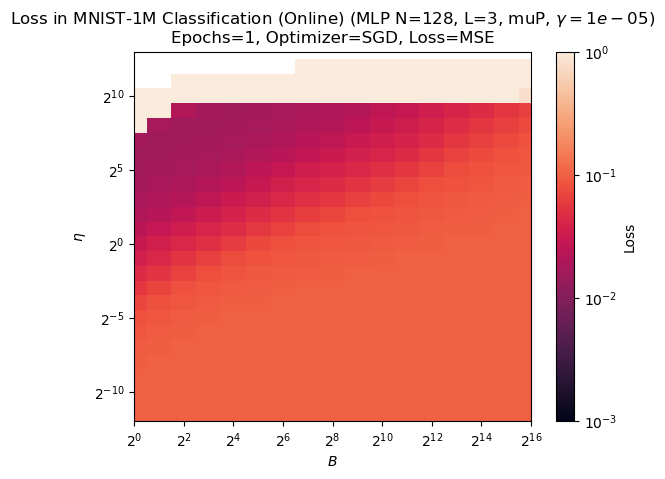

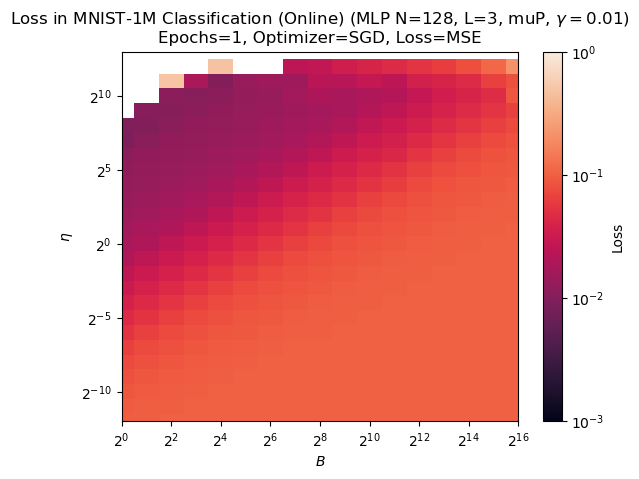

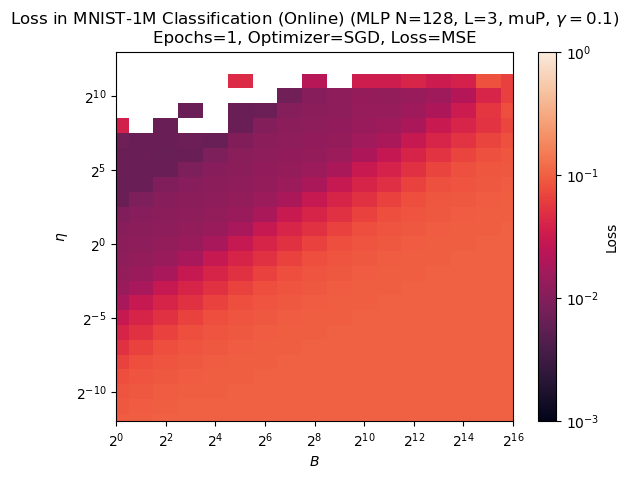

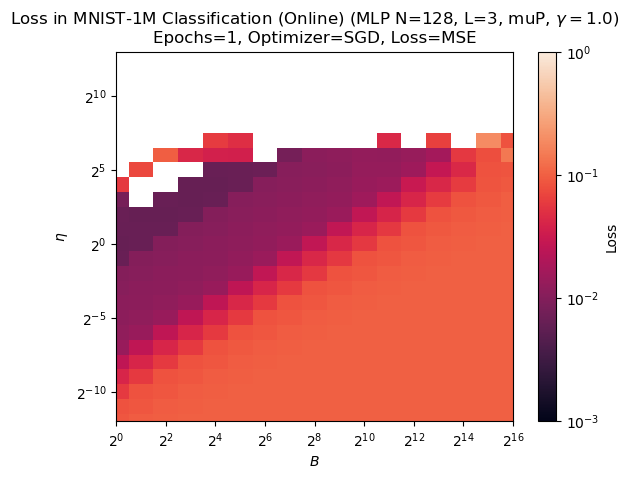

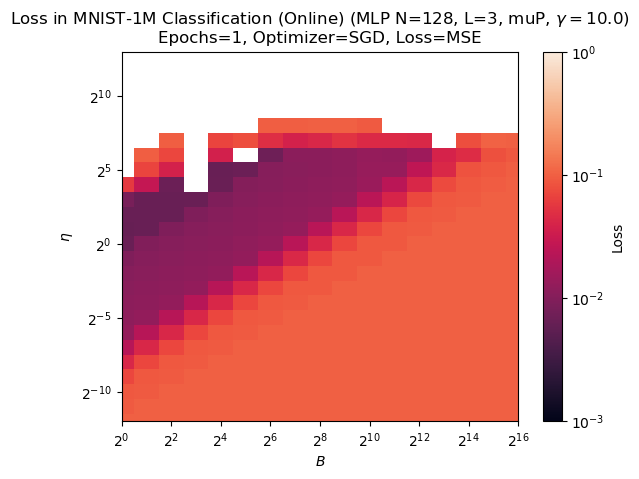

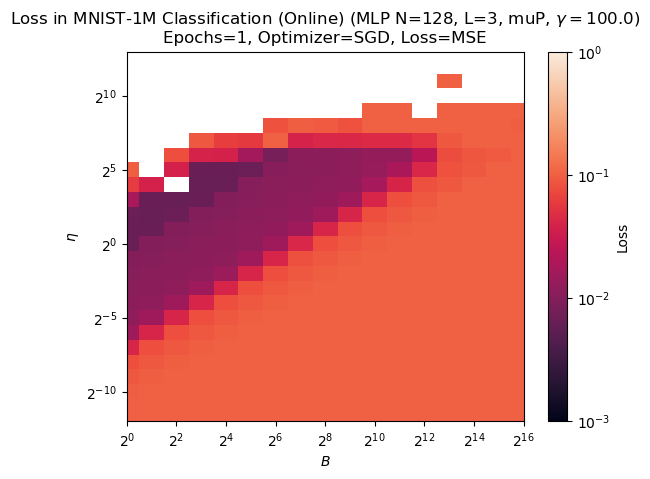

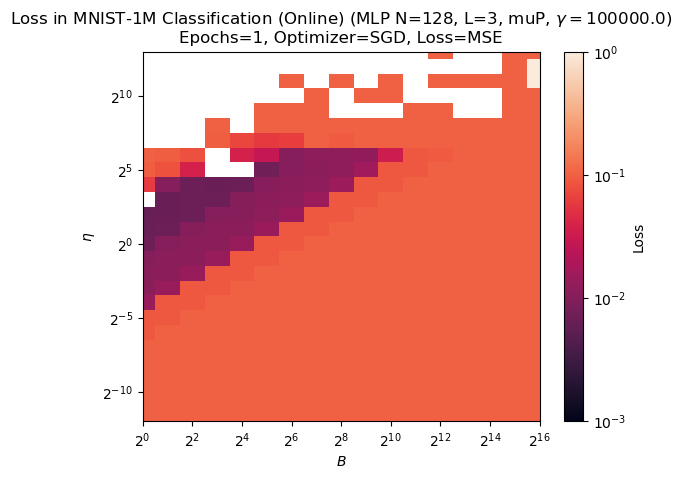

In [11]:
for exp_name, losses in loss_dicts.items():
    plot_loss_heatmap(
        sample_aware_smooth_loss_dicts(losses, rk_smoother),
        batch_sizes,
        etas,
        experiments[exp_name].plot_title(),
        clim=(-3, 0),
    )

To do the heatmap with temperature, i.e. $\frac{\eta}{B}$, as $x$-axis, set the flag `use_ratio_axis` to `True`.

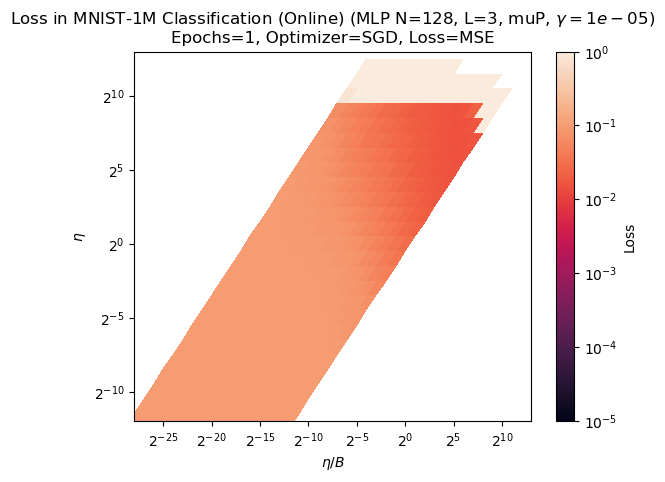

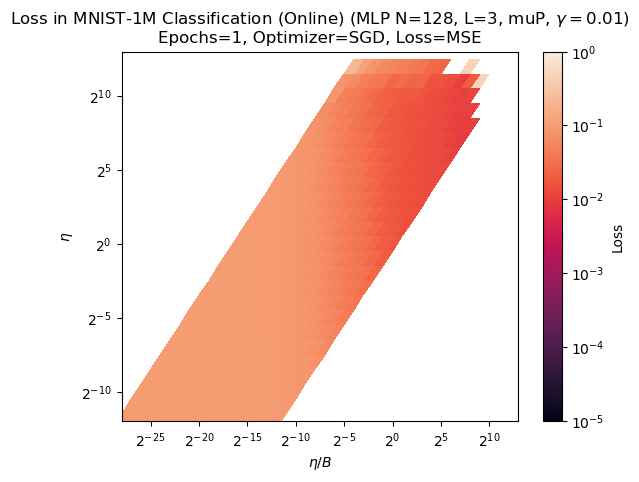

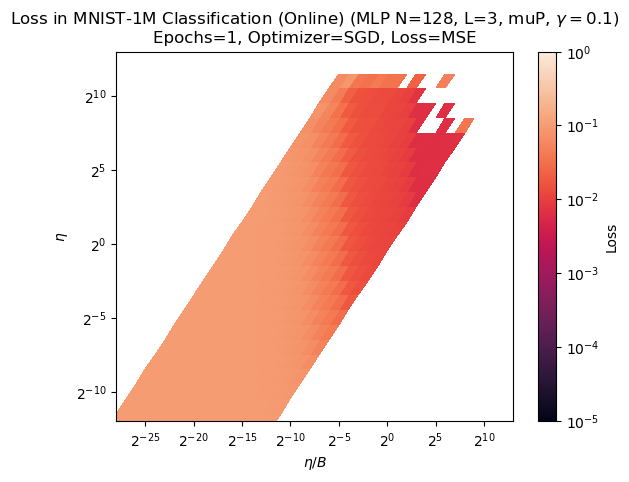

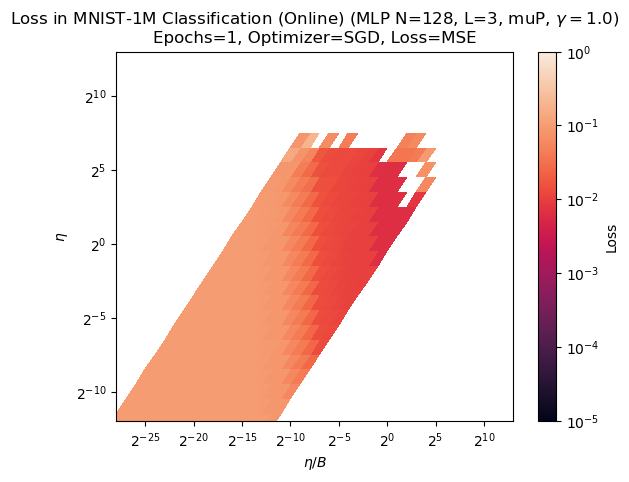

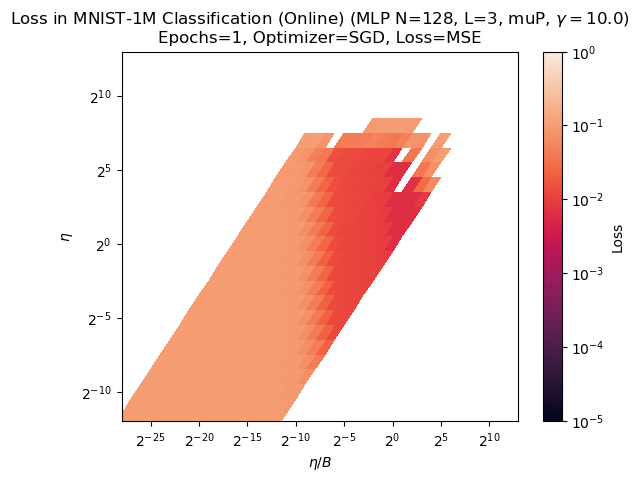

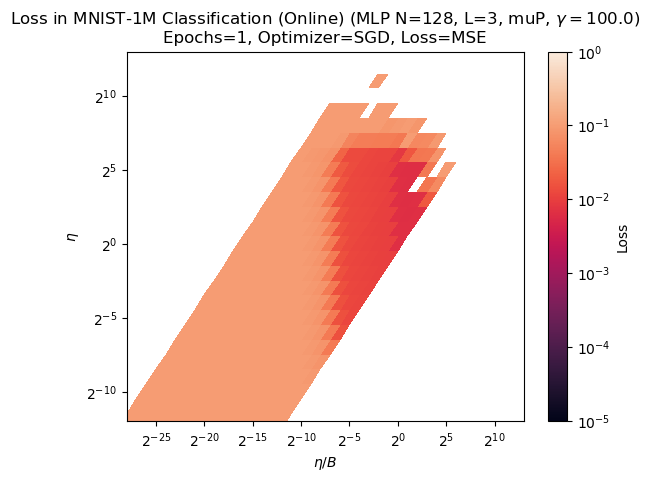

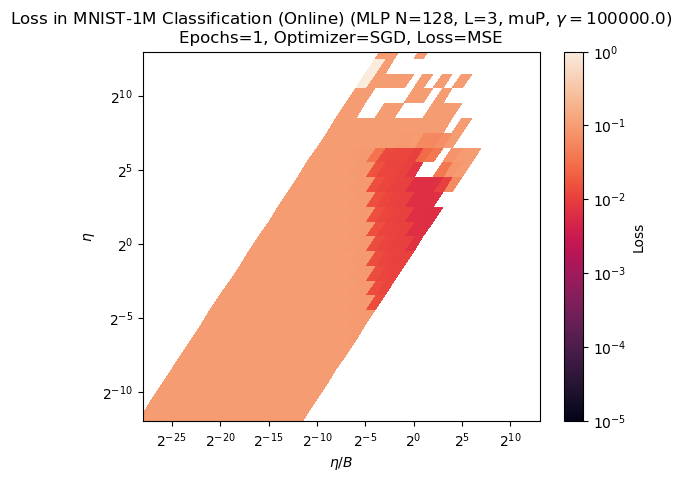

In [12]:
for exp_name, losses in loss_dicts.items():
    plot_loss_heatmap(
        sample_aware_smooth_loss_dicts(losses, rk_smoother),
        batch_sizes,
        etas,
        experiments[exp_name].plot_title(),
        clim=(-5, 0),
        use_ratio_axis=True,
    )

## Lazy networks and theoretical bounds

In [13]:
e_name = "mnist1m_mup_MSE_SGD_gamma0p01_epochs1"
ld = loss_dicts[e_name]
experiment = experiments[e_name]

In [14]:
evaluator = HessianEvaluator(
    experiment=experiment,
    run_key=None,  # stay at initialization
    step=None,
    # directory="experiments", # or your custom sweep directory
    num_hessian_samples=1024,
    hessian_batch_size=128,
)

eigvals, eigvecs = evaluator.top_eigenvalues(top_n=1)
lambda_max_val = eigvals[0].item()
tr_sigma_val = evaluator.trace(max_iter=100).item()

lambda_max_val, tr_sigma_val

(0.8500151634216309, 11.3264741897583)

In [15]:
# Computing the relevant quantities. Note lower_bound is a callable, while crit_batch is a float.

lower_bound = lambda b: 2 / (lambda_max_val * (1 + 1 / b) + tr_sigma_val / b)
crit_batch = tr_sigma_val / lambda_max_val

**Note on hyperparameter adjustments**

During training a μP network, we have perform a η-rescaling with γ (and width $L$). Thus, to match the theoretical guarantees from the linear case, we need to
- unwind the γ (and $L$) - rescaling
- (legacy) for older runs, we did not
    - normalize MSE by .5
    - for classification tasks, using one-hot encoding implicitly rescales by `num_outputs`, and we did not take into account

To that end, when we pass the callable `lower_bound` below, we have it wrapped in `reverse_eta_adjustment_theoretical` with `legacy_mse_scaling=True`.

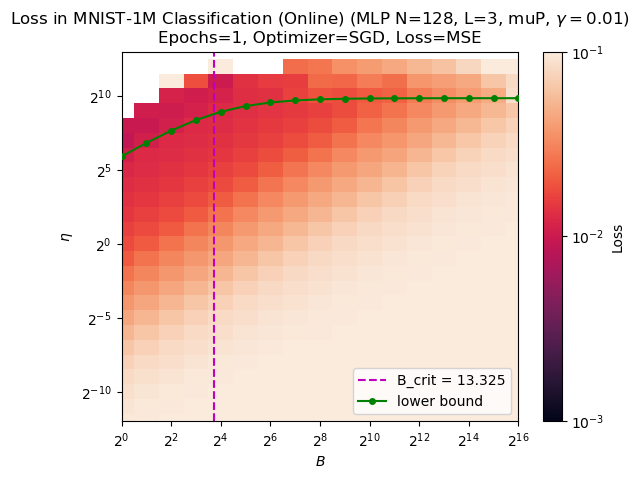

In [16]:
plot_heatmap_with_theory_curve(
    sample_aware_smooth_loss_dicts(ld, rk_smoother),
    batch_sizes,
    etas,
    experiment.plot_title(),
    lower_bound=reverse_eta_adjustment_theoretical(lower_bound, experiment, legacy_mse_scaling=True),
    crit_batch=crit_batch,
    clim=(-3, -1),
);

## Individual Loss curves

For particular temperatures, etas or batch size, use the `plot_loss_curves`. The docstring is extensive but relevant parameter is:

- `group_by`: `"B"`, `"eta"`, or `"temp"` to choose whether each curve corresponds to a batch size, learning rate, or η/B temperature.
- `group_values`: optional list restricting which groups to plot. If not selected all values for the `group_by` are plotted.
- X-axis tweaks:
  - `use_eff_steps=True` → plot steps × η (effective steps).
  - `use_samples_seen=True` → plot steps × batch size (samples seen).
  - Leave both False for raw step count.
- Scales: pass `x_scale="log"` or `y_scale="log"` to change axis scaling.

In [17]:
# Recall we have all batches, η and temperatures precomputed already
print("batches:", batch_sizes, "\n\n η:", etas, "\n\n temps:", all_temps)

batches: [1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, 32768, 65536] 

 η: [0.000244140625, 0.00048828125, 0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0] 

 temps: [3.72529030e-09 7.45058060e-09 1.49011612e-08 2.98023224e-08
 5.96046448e-08 1.19209290e-07 2.38418579e-07 4.76837158e-07
 9.53674316e-07 1.90734863e-06 3.81469727e-06 7.62939453e-06
 1.52587891e-05 3.05175781e-05 6.10351562e-05 1.22070312e-04
 2.44140625e-04 4.88281250e-04 9.76562500e-04 1.95312500e-03
 3.90625000e-03 7.81250000e-03 1.56250000e-02 3.12500000e-02
 6.25000000e-02 1.25000000e-01 2.50000000e-01 5.00000000e-01
 1.00000000e+00 2.00000000e+00 4.00000000e+00 8.00000000e+00
 1.60000000e+01 3.20000000e+01 6.40000000e+01 1.28000000e+02
 2.56000000e+02 5.12000000e+02 1.02400000e+03 2.04800000e+03
 4.09600000e+03 8.19200000e+03]


In [18]:
gamma0 = "mnist1m_mup_MSE_SGD_gamma0p01_epochs1"

In [19]:
temps = np.power(2.0, np.arange(-6, 4, 3))

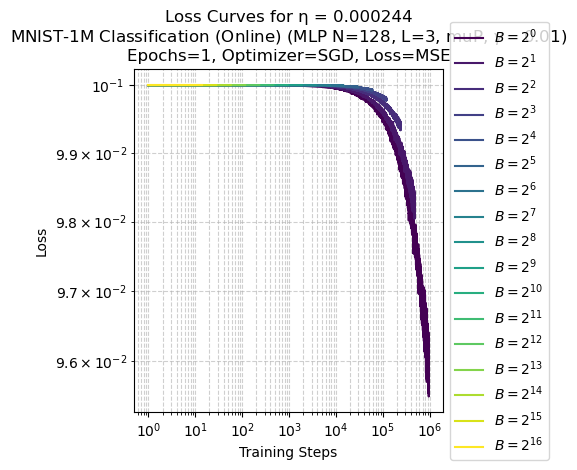

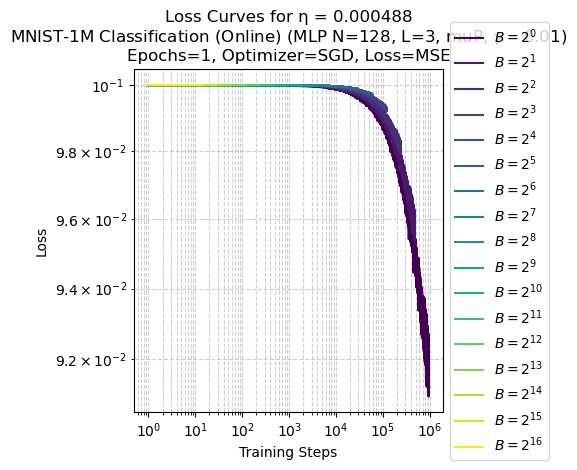

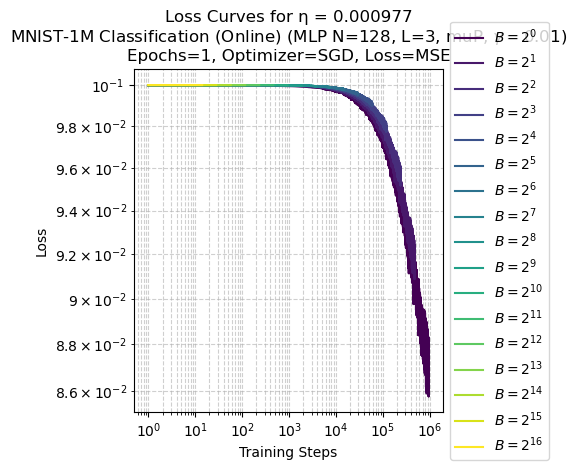

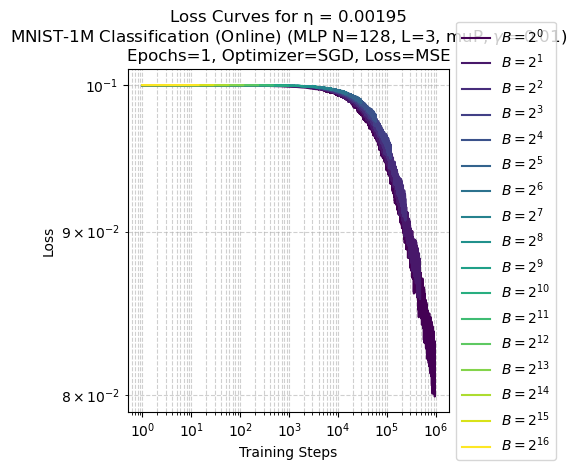

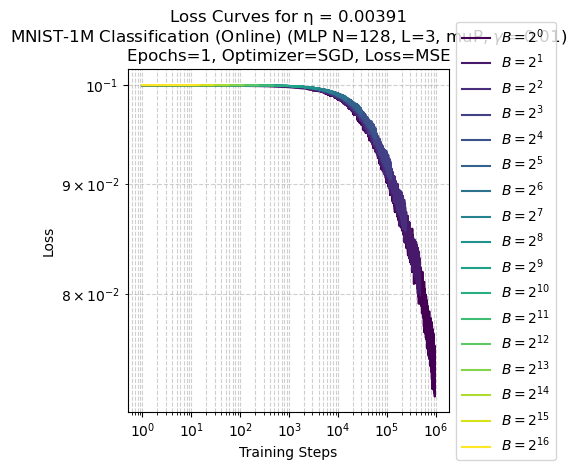

...

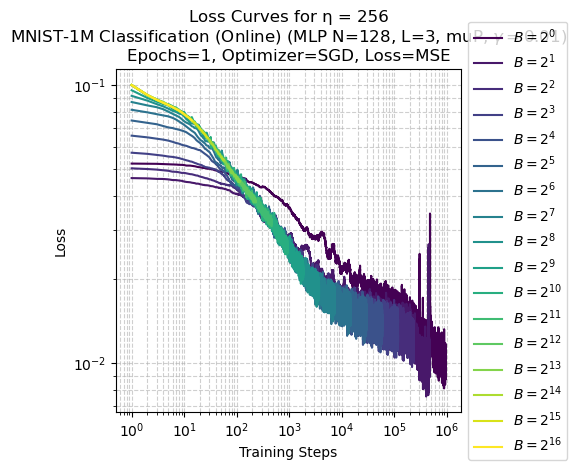

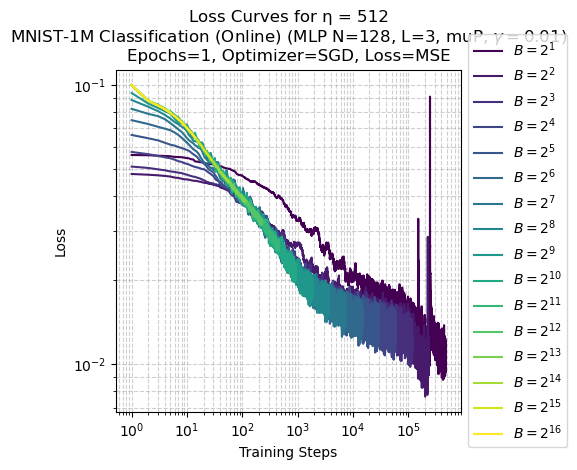

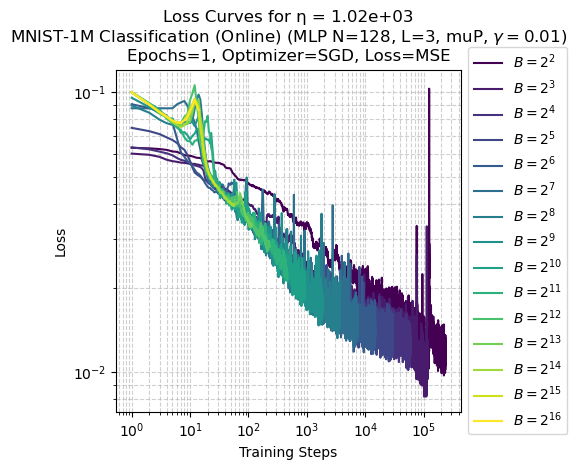

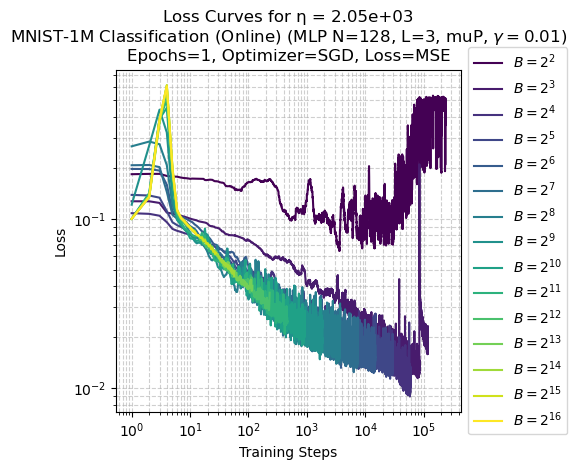

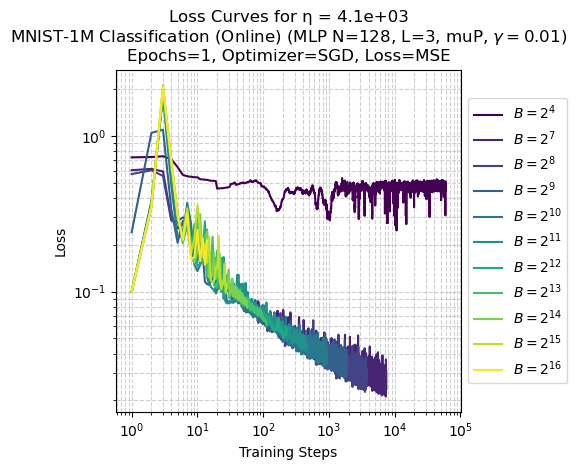

In [20]:
for temp in temps:
    plot_loss_curves(
        sample_aware_smooth_loss_dicts(
            filter_loss_dicts(loss_dicts[gamma0], filter_by="eta", values=[4, 8], keep=False), rk_smoother
        ),
        title_exp=experiments[gamma0].plot_title(),
        group_by="eta",
        # group_values=temp,
        # use_eff_steps=True,
        x_scale="log",
        cmap="viridis",
        display_now=True,
    )

Available filtering/subsampling helpers in `data_utils.py`:

- `filter_loss_dicts(loss_dict, filter_by, values, keep=True)`: keep or drop runs by batch size (`"B"`), learning rate (`"eta"`), or temperature (`"temp"`).
- `filter_loss_dict_by_cutoff(loss_dict, filter_by, cutoff, filter_below=True)`: trim runs whose batch size / η / temperature is above or below a threshold.
- `subsample_loss_dict_periodic(loss_dict, subsample_by, every)`: take every *n*-th batch size, η, or both.
- `uniform_smooth_loss_dicts(loss_dict, smoother)` / `sample_aware_smooth_loss_dicts(loss_dict, smoother)`: apply a smoothing callable to each loss history (with or without access to the `RunKey`).
- `extract_noise_loss_dicts(loss_dict, smoother)`: subtract the smoothed trend to study residual noise.

All of them accept either a single loss dict or a list of dicts via decorator.


## Training loss curves

## Loss curves combined

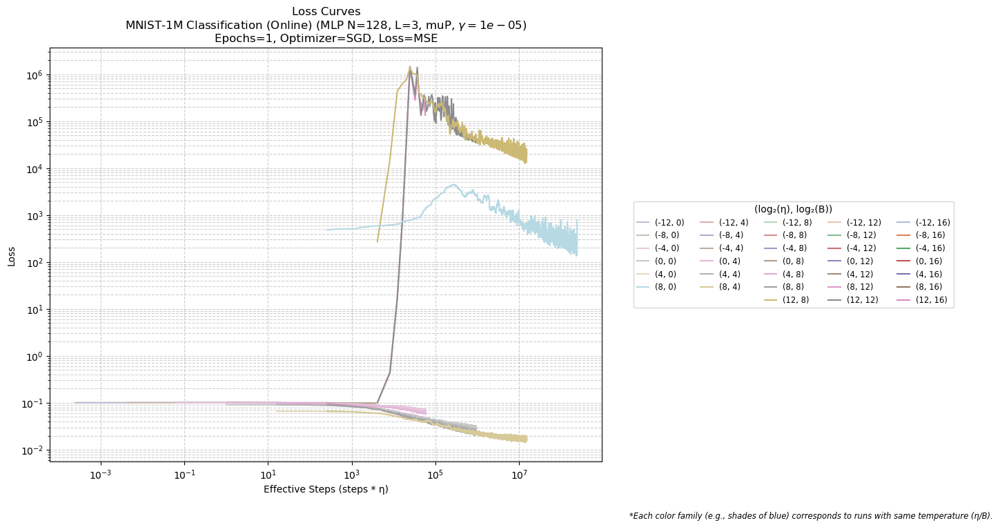

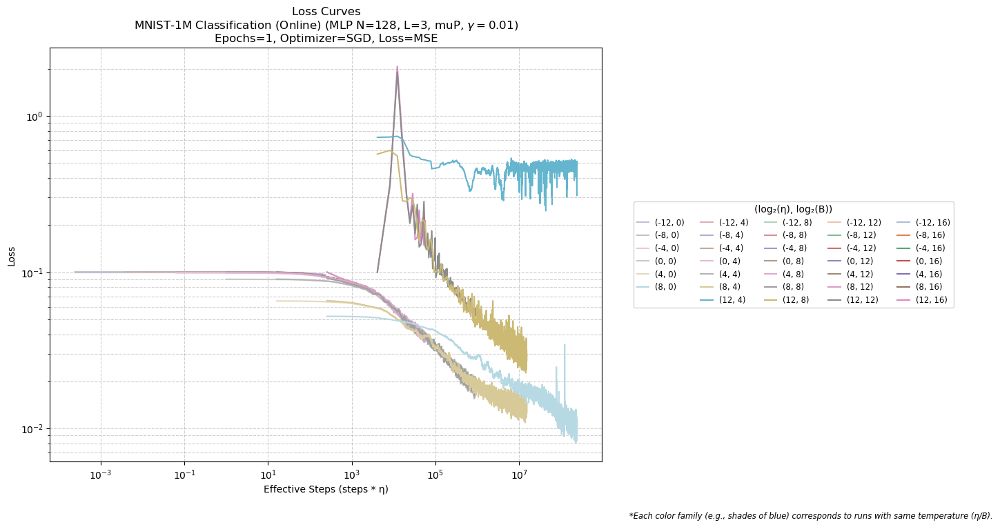

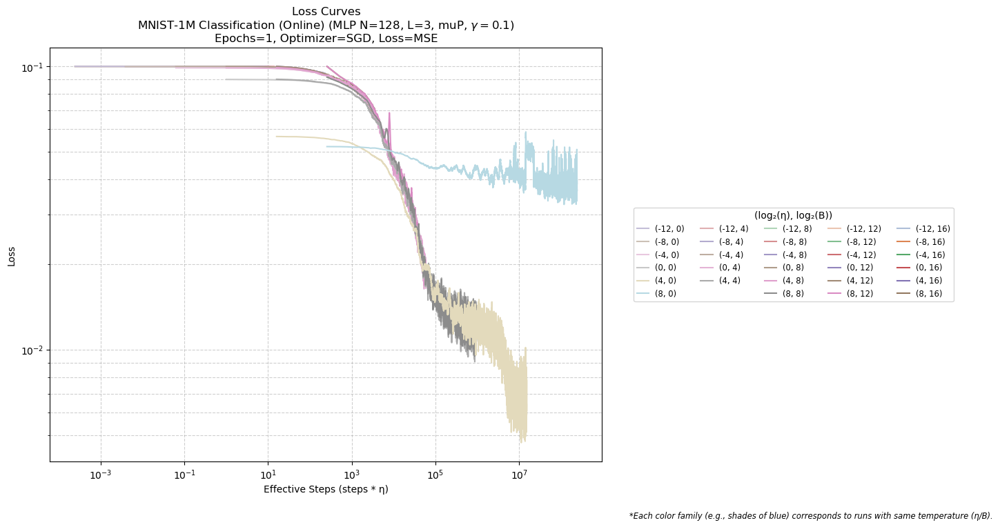

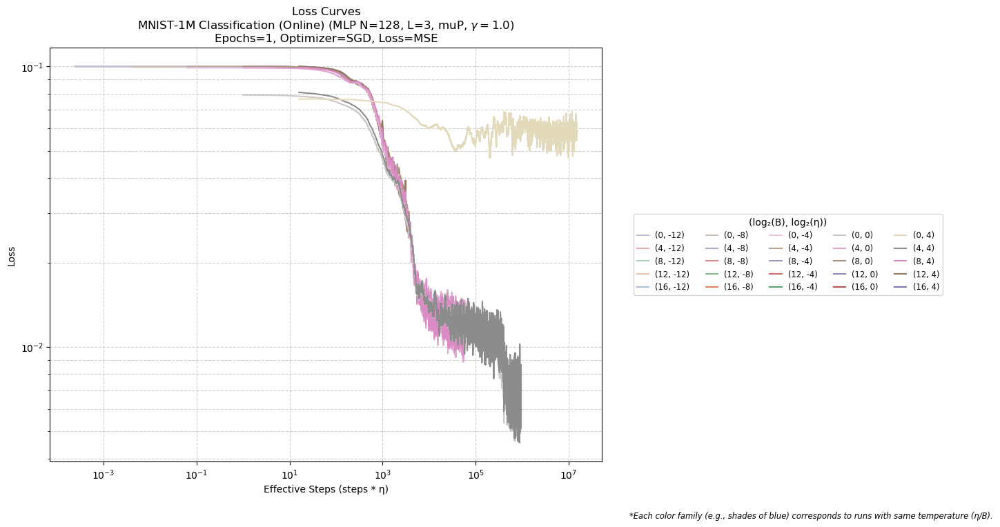

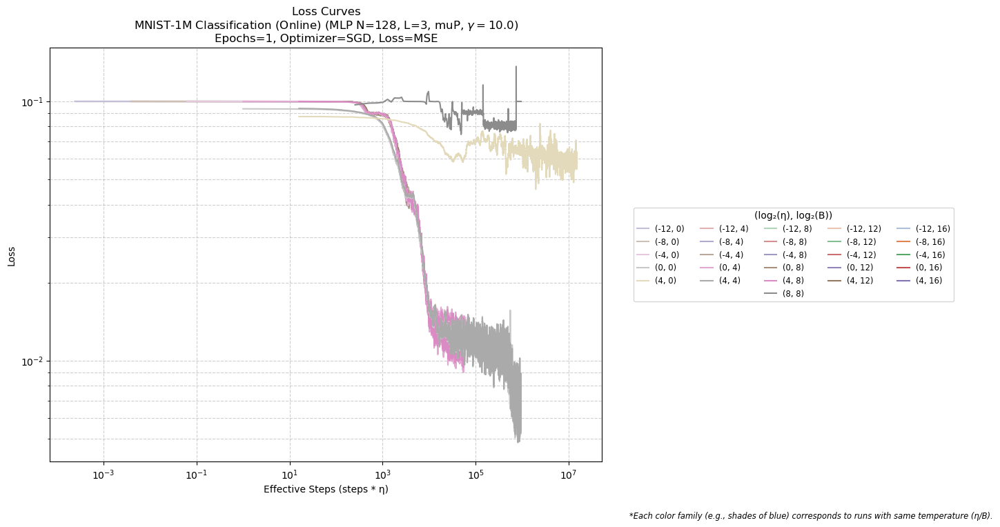

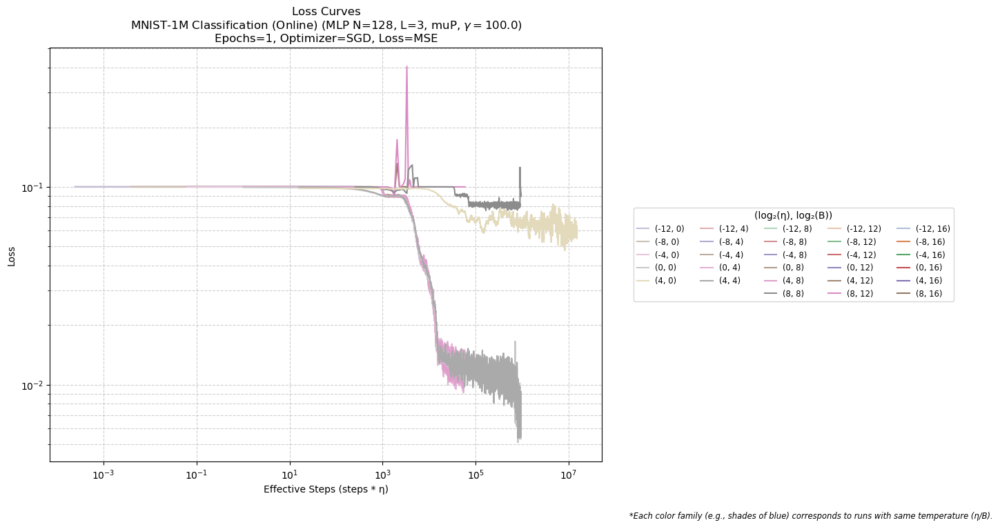

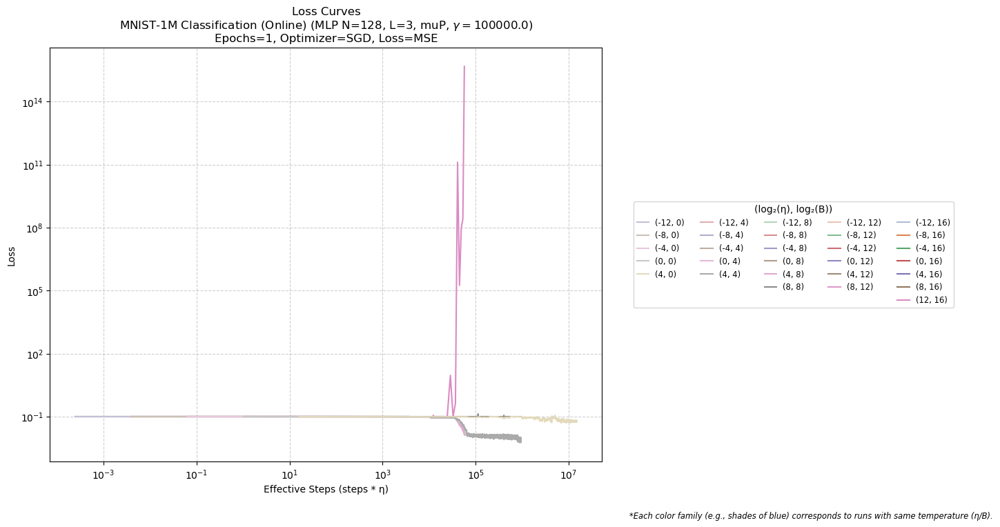

In [21]:
for gamma0 in experiments.keys():
    plot_all_loss_curves(
        sample_aware_smooth_loss_dicts(subsample_loss_dict_periodic(loss_dicts[gamma0], "both", 4), rk_smoother),
        title_exp=experiments[gamma0].plot_title(),
        plot_group_by="temp",
        use_eff_steps=True,
        x_scale="log",
    )

# Exploratory questions

These are speculative questions that have not be fully fleshed out.

## Q1: For laziest network, is catapult affected by temperature or only by η?

We check if "if one, then all" behavior is noticed wherein if a network catapults for certain (b,η) with given temperature it catapults for all other pairs of that temp.

In [22]:
gamma0 = "mnist1m_mup_MSE_SGD_gamma100000p0_epochs1"

In [23]:
losses, experiment = loss_dicts[gamma0], experiments[gamma0]

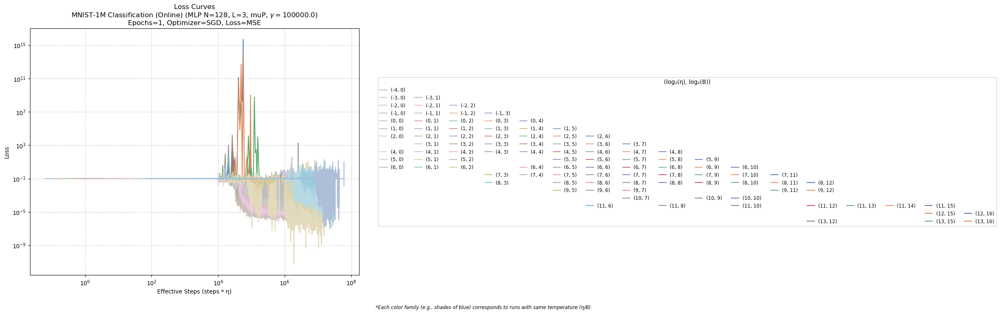

In [24]:
plot_all_loss_curves(
    filter_loss_dict_by_cutoff(losses, "temp", 2**-4),
    title_exp=experiment.plot_title(),
    plot_group_by="temp",
    use_eff_steps=True,
    x_scale="log",
);

In [25]:
# a run (b,η) is considered catapulting if at any point the training loss exceeds the cutoff
catapult_cutoff = 2e1

In [26]:
catapult_candidates = {rk: v for rk, v in losses.items() if max(v["loss_history"]) > catapult_cutoff}
catapulting_temps = set(rk.temp for rk in catapult_candidates.keys())

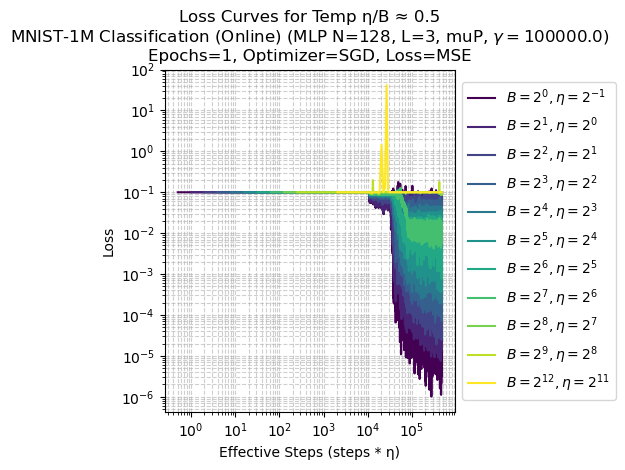

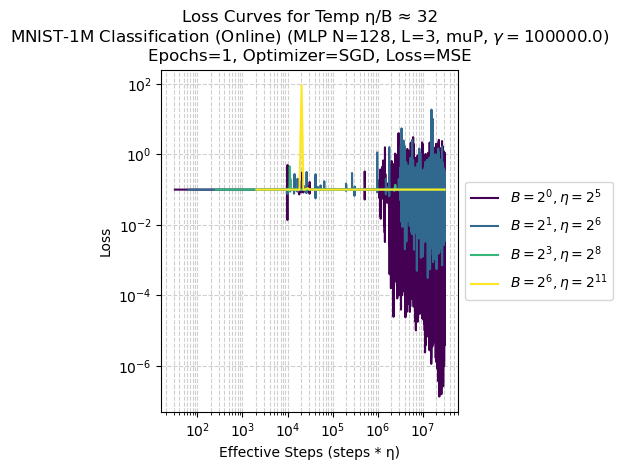

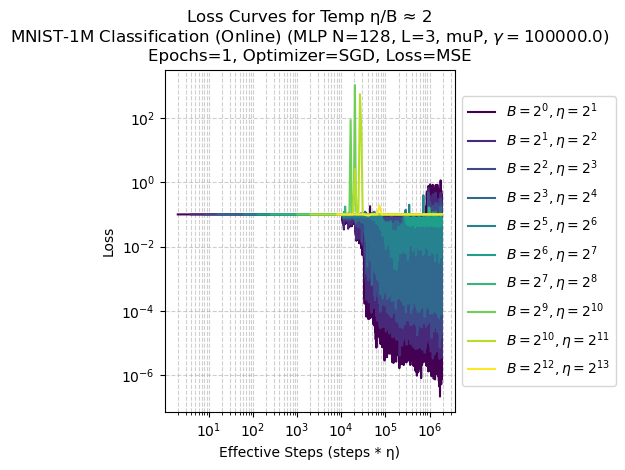

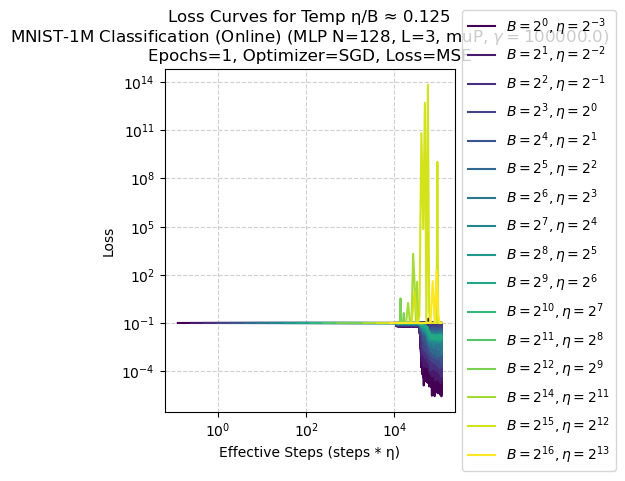

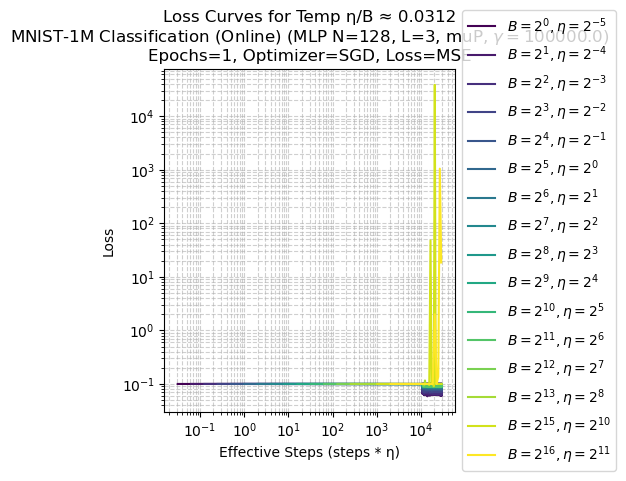

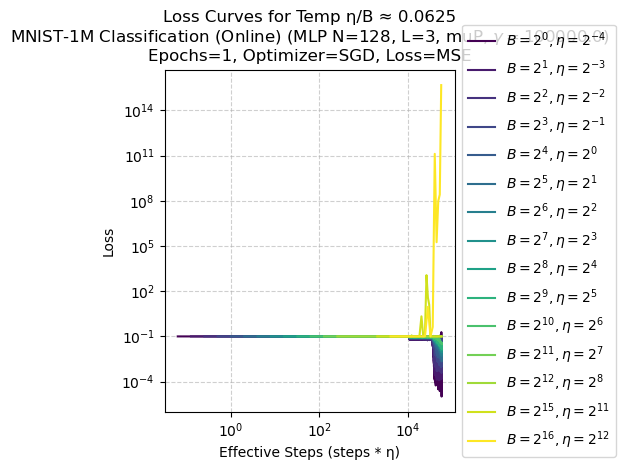

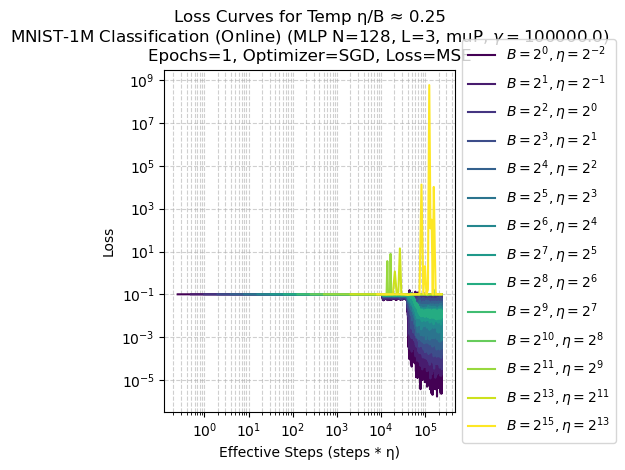

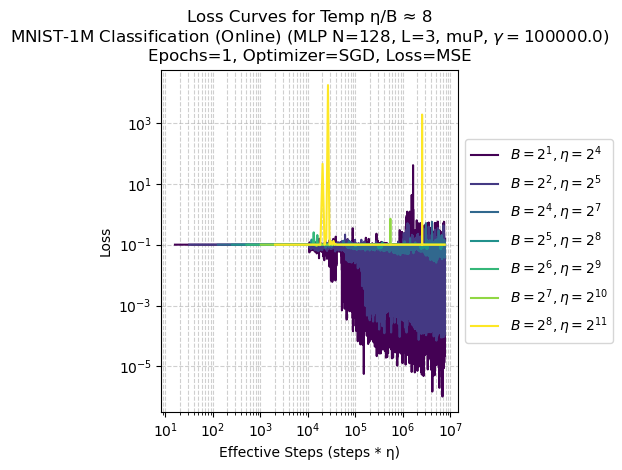

In [27]:
for temp in catapulting_temps:
    plot_loss_curves(
        losses,
        title_exp=experiment.plot_title(),
        group_by="temp",
        group_values=temp,
        use_eff_steps=True,
        x_scale="log",
        cmap="viridis",
    )

## Q2: Quantifying noise


This one is mostly experimental for now

In [28]:
from batch_size_studies.data_utils import extract_noise_loss_dicts

`extract_noise_loss_dicts(loss_dict, smoother)` computes the residual (“noise”) for each run after subtracting a smoothed trend:

1. For each `RunKey` it grabs the recorded loss history $$ \ell = (\ell_1, \dots, \ell_T). $$
2. Calls your `smoother(run_key,` $\ell$`)` to produce a baseline curve $\hat{\ell} $ (e.g., a moving average).
3. Aligns lengths: if the smoother drops the first \(k\) points (common for a trailing window), it trims $\ell$ so both sequences start at the first index with a full window; smoothers that return a longer sequence raise an error.
4. Stores the residual $r = \ell' - \hat{\ell}$ (elementwise subtraction) under the same `RunKey`.


In [29]:
noise = defaultdict(list)
for gamma0, loss_dict in loss_dicts.items():
    noise[gamma0] = extract_noise_loss_dicts(loss_dict, rk_smoother)

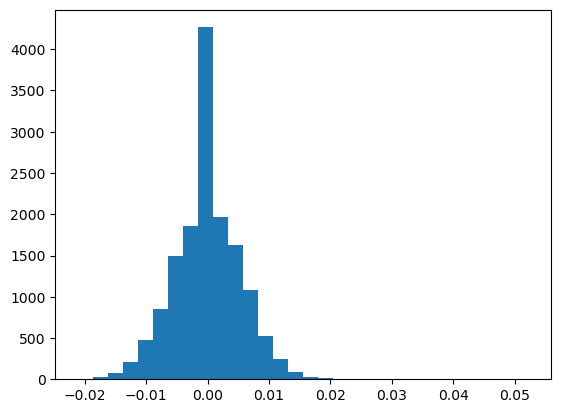

In [30]:
rk = RunKey(batch_size=64, eta=128.0)
plt.hist(noise["mnist1m_mup_MSE_SGD_gamma100000p0_epochs1"][rk], bins=30);